In [1]:
import pandas as pd
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Reshape, LSTM, BatchNormalization, TimeDistributed
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

In [2]:
# Load annotations
detection_annotations = pd.read_csv(r'C:\Users\hp\Documents\Assigments\Licplatesdetection_train.csv')
recognition_annotations = pd.read_csv(r'C:\Users\hp\Documents\Assigments\Licplatesrecognition_train.csv')

In [3]:
detection_annotations.head()

,img_id,ymin,xmin,ymax,xmax
0,1.jpg,276,94,326,169
1,10.jpg,311,395,344,444
2,100.jpg,406,263,450,434
3,101.jpg,283,363,315,494
4,102.jpg,139,42,280,222


In [4]:
recognition_annotations.head()

,img_id,text
0,0.jpg,117T3989
1,1.jpg,128T8086
2,10.jpg,94T3458
3,100.jpg,133T6719
4,101.jpg,68T5979


In [5]:
# Function to load images
def load_images(image_folder):
    images = []
    for filename in sorted(os.listdir(image_folder)):
        img = cv2.imread(os.path.join(image_folder, filename))
        if img is not None:
            images.append(img)
    return images

In [6]:
# Load images
detection_images = load_images(r'C:\Users\hp\Documents\Assigments\license_plates_detection_train')
recognition_images = load_images(r'C:\Users\hp\Documents\Assigments\license_plates_recognition_train')

In [17]:
# Display a few images with bounding boxes
def display_images_with_boxes(images, annotations, num_images=10):
    for i in range(num_images):
        img = images[i].copy()
        row = annotations.iloc[i]
        ymin, xmin, ymax, xmax = row['ymin'], row['xmin'], row['ymax'], row['xmax']
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()

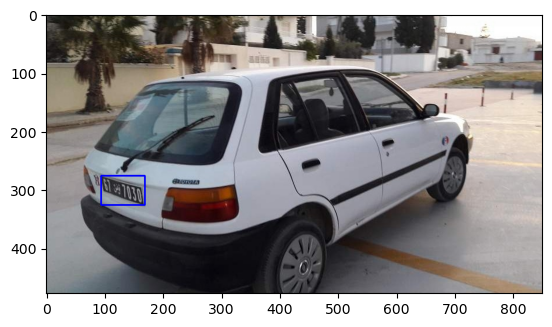

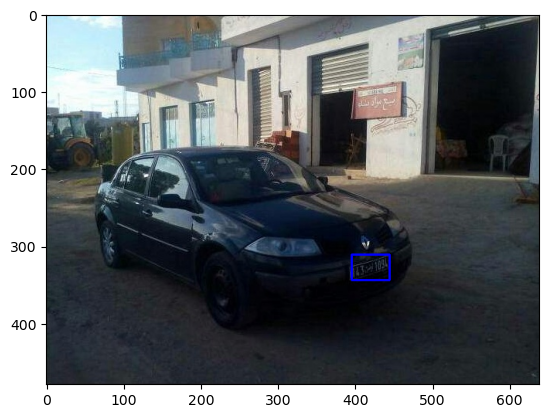

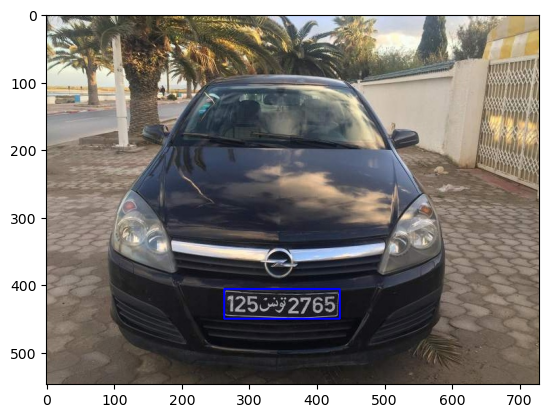

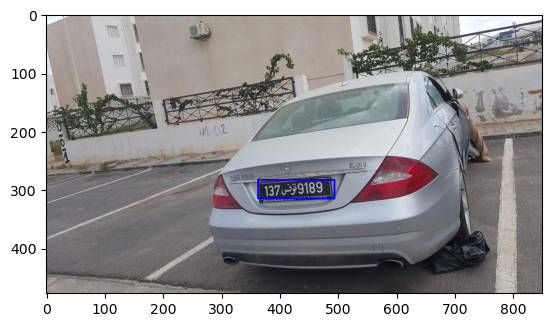

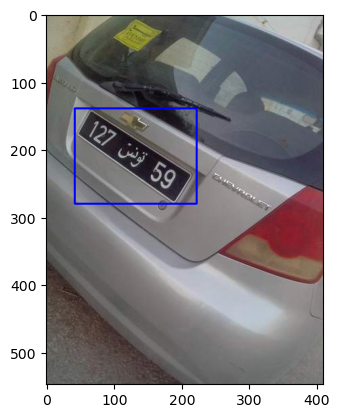

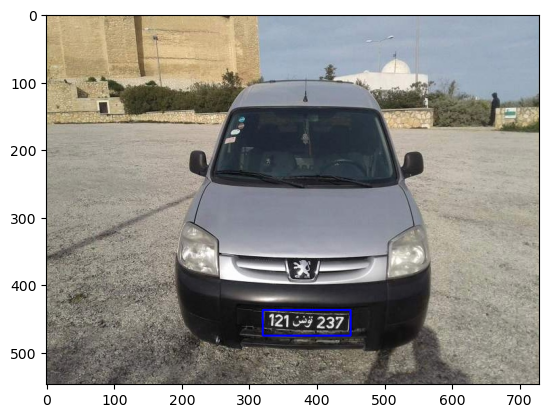

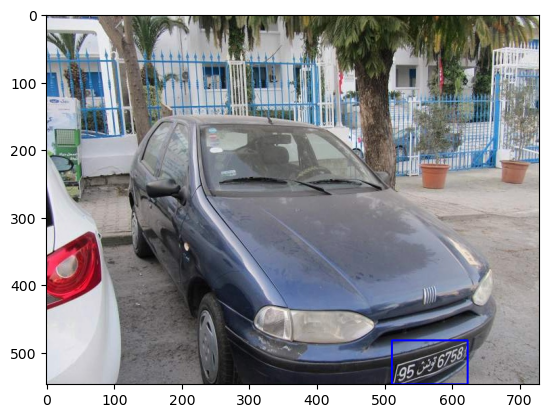

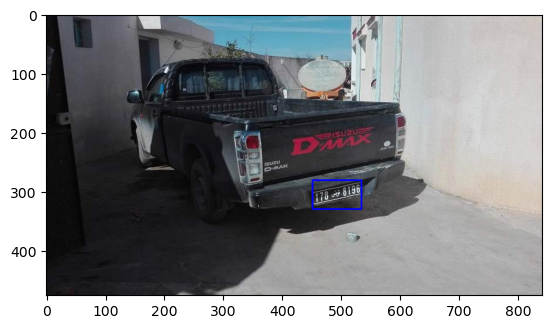

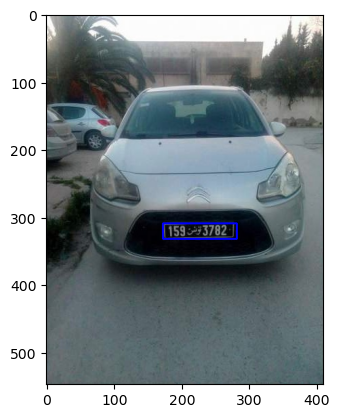

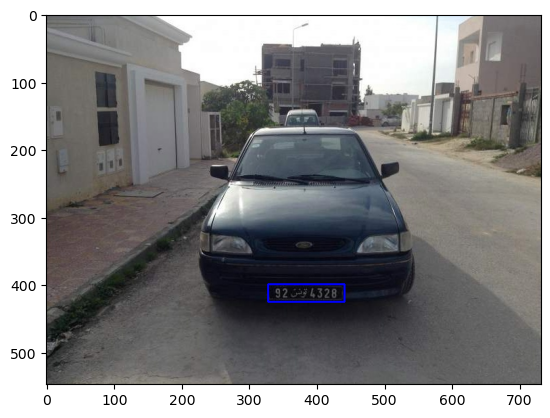

In [18]:
# Visualize detection images with bounding boxes
display_images_with_boxes(detection_images, detection_annotations)

In [19]:
# Display a few license plate images
def display_license_plates(images, annotations, num_images=10):
    for i in range(num_images):
        img = images[i].copy()
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(annotations.iloc[i]['text'])
        plt.show()

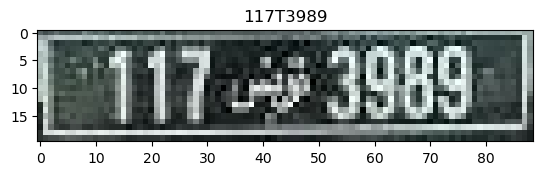

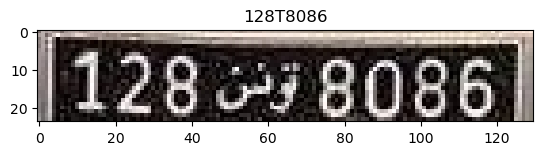

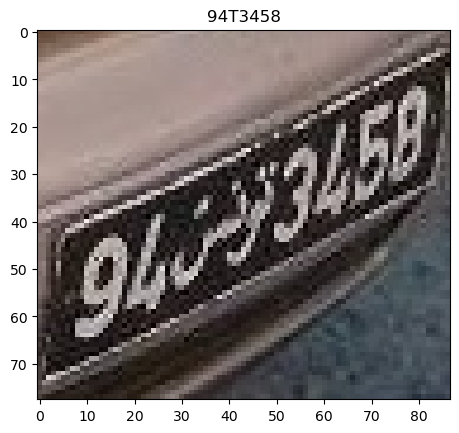

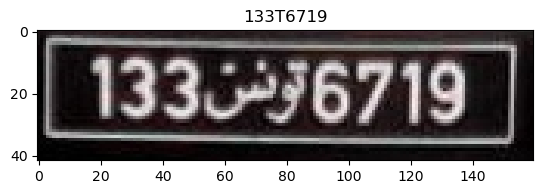

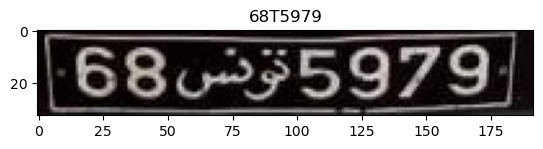

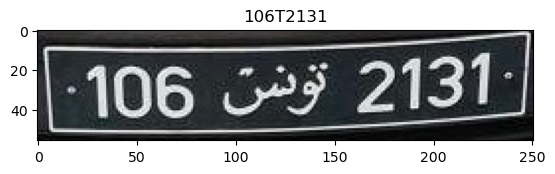

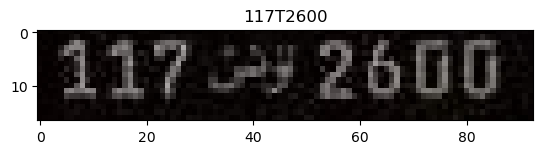

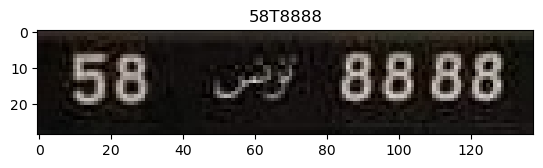

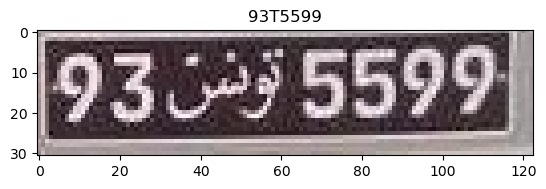

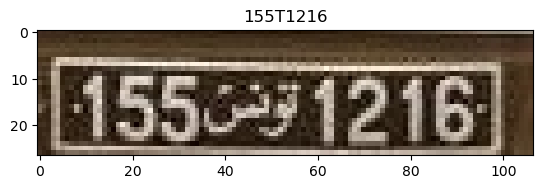

In [20]:
# Visualize license plate images with text annotations
display_license_plates(recognition_images, recognition_annotations)

In [21]:
# Define the image data generator for augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [86]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Load pre-trained MobileNetV2 model + higher level layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of it
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dense(4, activation='linear')(x)  # Bounding box coordinates

detections_model = Model(inputs=base_model.input, outputs=x)

# Define the optimizer with the desired learning rate
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the defined optimizer
detections_model.compile(optimizer=optimizer, loss='mean_squared_error')


In [24]:
# Resize images and prepare target values for the detection model
def preprocess_detection_data(images, annotations):
    X = []
    y = []
    for i in range(len(images)):
        img = cv2.resize(images[i], (224, 224))
        X.append(img)
        row = annotations.iloc[i]
        ymin, xmin, ymax, xmax = row['ymin'], row['xmin'], row['ymax'], row['xmax']
        y.append([ymin, xmin, ymax, xmax])
    return np.array(X), np.array(y)

X_detection, y_detection = preprocess_detection_data(detection_images, detection_annotations)


In [25]:
# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_detection, y_detection, test_size=0.2, random_state=42)

In [26]:
# Data augmentation
train_generator = datagen.flow(X_train, y_train, batch_size=32)

In [27]:
# Train the model
detection_model.fit(train_generator, epochs=50, validation_data=(X_val, y_val))

Epoch 1/50


C:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 323s 9s/step - loss: 115575.5078 - val_loss: 106809.3203
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 116s 5s/step - loss: 92503.4609 - val_loss: 82307.0234
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 108s 5s/step - loss: 35490.8945 - val_loss: 19353.8809
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 112s 5s/step - loss: 9317.4512 - val_loss: 14675.0527
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 115s 5s/step - loss: 8581.3184 - val_loss: 14550.8115
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 127s 5s/step - loss: 6923.9717 - val_loss: 13761.7334
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 632s 28s/step - loss: 6740.3394 - val_loss: 16100.3643
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 128s 5s/step - loss: 5541.7070 - val_loss: 14519.3477
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 143s 6s/step - loss: 4993.0122 - val_loss: 12761.6543
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 135s 6s/step - loss: 4504.7212 - val_loss: 16271.4678
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 186s 8s/step - loss: 4301.9038 - val_loss: 13

In [87]:
# Train the model
detections_model.fit(train_generator, epochs=30, validation_data=(X_val, y_val))

Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 548s 6s/step - loss: 115609.7500 - val_loss: 107527.6016
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 122s 5s/step - loss: 94869.0312 - val_loss: 85308.1094
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 117s 5s/step - loss: 41335.1602 - val_loss: 24470.8926
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 124s 5s/step - loss: 9365.4912 - val_loss: 14591.0420
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 114s 5s/step - loss: 8336.2100 - val_loss: 13714.1484
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 113s 5s/step - loss: 7669.3564 - val_loss: 12538.3125
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 113s 5s/step - loss: 6338.7002 - val_loss: 11589.9023
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 116s 5s/step - loss: 5522.2363 - val_loss: 12342.8926
Epoch 9/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 120s 5s/step - loss: 5380.4683 - val_loss: 11517.4512
Epoch 10/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 129s 5s/step - loss: 4365.6592 - val_loss: 10900.9629
Epoch 11/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 127s 5s/step - loss: 3604.7605 - va

In [29]:
# Character recognition model
input_shape = (64, 128, 3)  # Adjust based on your cropped license plate images
num_classes = 36  # 26 letters + 10 digits

recognition_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

optimizer = Adam(learning_rate=0.0001)
recognition_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [37]:
# Parameters
input_shape = (128, 64, 3)  # Adjust based on your cropped license plate images
num_classes = 36  # 26 letters + 10 digits
max_text_length = 10  # Maximum length of text in license plate

# Character recognition model
recognition_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(max_text_length * 128, activation='relu'),  # Output shape for reshaping
    Reshape((max_text_length, 128)),  # Reshape to sequence length
    LSTM(64, return_sequences=True),
    TimeDistributed(Dense(num_classes, activation='softmax'))
])

# Compile the model
optimizer = Adam(learning_rate=0.0001)
recognition_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [38]:
def preprocess_recognition_data(images, annotations, num_classes=36, max_text_length=10):
    X = []
    y = []
    char_set = "ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"
    char_dict = {char: idx for idx, char in enumerate(char_set)}
    
    for i in range(len(images)):
        # Resize image to (64, 128)
        img = cv2.resize(images[i], (64, 128))
        X.append(img)
        
        # Get text annotation for the current image
        text = annotations.iloc[i]['text']
        
        # Convert text to a list of character indices
        label = [char_dict[char] for char in text]
        
        # Pad label to max_text_length with a padding character (e.g., 0)
        padded_label = label + [0] * (max_text_length - len(label))
        
        # One-hot encode the padded label
        one_hot_label = to_categorical(padded_label, num_classes=num_classes)
        
        y.append(one_hot_label)
    
    return np.array(X), np.array(y)


X_recognition, y_recognition = preprocess_recognition_data(recognition_images, recognition_annotations)

In [39]:
# Split data into training and validation sets
X_train_rec, X_val_rec, y_train_rec, y_val_rec = train_test_split(X_recognition, y_recognition, test_size=0.2, random_state=42)

In [62]:
# Train the model
recognition_model.fit(X_train_rec, y_train_rec, epochs=200, validation_data=(X_val_rec, y_val_rec))

Epoch 1/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 203ms/step - accuracy: 0.8277 - loss: 0.5365 - val_accuracy: 0.5806 - val_loss: 1.4416
Epoch 2/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 186ms/step - accuracy: 0.8181 - loss: 0.5545 - val_accuracy: 0.5778 - val_loss: 1.4408
Epoch 3/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8262 - loss: 0.5361 - val_accuracy: 0.5739 - val_loss: 1.4415
Epoch 4/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 182ms/step - accuracy: 0.8466 - loss: 0.5015 - val_accuracy: 0.5728 - val_loss: 1.4530
Epoch 5/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8192 - loss: 0.5564 - val_accuracy: 0.5772 - val_loss: 1.4634
Epoch 6/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step - accuracy: 0.8282 - loss: 0.5328 - val_accuracy: 0.5767 - val_loss: 1.4663
Epoch 7/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 207ms/step - accuracy: 0.8304 - loss: 0.5318 - val_accuracy: 0.5794 - val_loss: 1.4476
Epoch 8/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 190ms/step - accuracy: 0.8324 - loss: 0.5381 - val_accu

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step - accuracy: 0.8503 - loss: 0.4710 - val_accuracy: 0.5789 - val_loss: 1.4660
Epoch 52/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 183ms/step - accuracy: 0.8366 - loss: 0.4971 - val_accuracy: 0.5850 - val_loss: 1.4748
Epoch 53/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8317 - loss: 0.5206 - val_accuracy: 0.5739 - val_loss: 1.4797
Epoch 54/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 189ms/step - accuracy: 0.8397 - loss: 0.5034 - val_accuracy: 0.5778 - val_loss: 1.4721
Epoch 55/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.8460 - loss: 0.4809 - val_accuracy: 0.5750 - val_loss: 1.4850
Epoch 56/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 189ms/step - accuracy: 0.8426 - loss: 0.4790 - val_accuracy: 0.5772 - val_loss: 1.4920
Epoch 57/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8387 - loss: 0.4967 - val_accuracy: 0.5778 - val_loss: 1.4928
Epoch 58/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step - accuracy: 0.8393 - loss: 0.4930 - val_accuracy:

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 184ms/step - accuracy: 0.8510 - loss: 0.4659 - val_accuracy: 0.5767 - val_loss: 1.5160
Epoch 102/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step - accuracy: 0.8533 - loss: 0.4564 - val_accuracy: 0.5761 - val_loss: 1.5283
Epoch 103/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step - accuracy: 0.8519 - loss: 0.4530 - val_accuracy: 0.5800 - val_loss: 1.5206
Epoch 104/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - accuracy: 0.8512 - loss: 0.4671 - val_accuracy: 0.5717 - val_loss: 1.5168
Epoch 105/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step - accuracy: 0.8554 - loss: 0.4484 - val_accuracy: 0.5806 - val_loss: 1.5255
Epoch 106/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8549 - loss: 0.4640 - val_accuracy: 0.5767 - val_loss: 1.5374
Epoch 107/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 183ms/step - accuracy: 0.8526 - loss: 0.4442 - val_accuracy: 0.5822 - val_loss: 1.5222
Epoch 108/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - accuracy: 0.8576 - loss: 0.4412 - val_ac

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8537 - loss: 0.4580 - val_accuracy: 0.5706 - val_loss: 1.5645
Epoch 151/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 183ms/step - accuracy: 0.8726 - loss: 0.4087 - val_accuracy: 0.5772 - val_loss: 1.5485
Epoch 152/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 184ms/step - accuracy: 0.8636 - loss: 0.4180 - val_accuracy: 0.5739 - val_loss: 1.6027
Epoch 153/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8619 - loss: 0.4239 - val_accuracy: 0.5700 - val_loss: 1.5877
Epoch 154/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8612 - loss: 0.4213 - val_accuracy: 0.5689 - val_loss: 1.5608
Epoch 155/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 186ms/step - accuracy: 0.8642 - loss: 0.4251 - val_accuracy: 0.5706 - val_loss: 1.5745
Epoch 156/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 184ms/step - accuracy: 0.8570 - loss: 0.4432 - val_accuracy: 0.5767 - val_loss: 1.5659
Epoch 157/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.8617 - loss: 0.4300 - val_ac

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8757 - loss: 0.3923 - val_accuracy: 0.5839 - val_loss: 1.5811
Epoch 200/200
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 191ms/step - accuracy: 0.8703 - loss: 0.3983 - val_accuracy: 0.5783 - val_loss: 1.5966


In [42]:
def detect_and_recognize(image, detection_model, recognition_model):
    # Step 1: Detect license plate
    img_resized = cv2.resize(image, (224, 224))
    img_expanded = np.expand_dims(img_resized, axis=0)
    bbox = detection_model1.predict(img_expanded)[0]
    
    ymin, xmin, ymax, xmax = bbox
    ymin, xmin, ymax, xmax = int(ymin * image.shape[0]), int(xmin * image.shape[1]), int(ymax * image.shape[0]), int(xmax * image.shape[1])
    
    # Step 2: Crop the license plate
    cropped_img = image[ymin:ymax, xmin:xmax]
    cropped_resized = cv2.resize(cropped_img, (64, 128))
    cropped_expanded = np.expand_dims(cropped_resized, axis=0)
    
    # Step 3: Recognize characters
    char_probs = recognition_model.predict(cropped_expanded)
    char_indices = np.argmax(char_probs, axis=1)
    
    char_set = "ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"
    detected_text = ''.join([char_set[idx] for idx in char_indices])
    
    return detected_text

In [ ]:
test_images = load_images(r'C:\Users\hp\Documents\Assigments\test')

# Assuming test_annotations contain the true labels for evaluation
test_annotations = pd.read_csv('test_annotations.csv')

correct_predictions = 0
total_predictions = len(test_images)

for i in range(total_predictions):
    detected_text = detect_and_recognize(test_images[i], detection_model, recognition_model)
    true_text = test_annotations.iloc[i]['text']
    if detected_text == true_text:
        correct_predictions += 1

accuracy = correct_predictions / total_predictions
print(f'Accuracy: {accuracy * 100:.2f}%')


In [ ]:
test_images = load_images('/path/to/test')
sample_submission = pd.read_csv('/path/to/samplesubmission.csv')

In [ ]:
predictions = []

for i, filename in enumerate(sample_submission['id']):
    image_path = f'/path/to/test/{filename}.jpg'
    image = cv2.imread(image_path)
    if image is not None:
        detected_text = detect_and_recognize(image, detection_model, recognition_model)
        row = [0] * 10
        for char in detected_text:
            if char.isdigit():
                row[int(char)] = 1
        predictions.append(row)
    else:
        predictions.append([0] * 10)

submission_df = pd.DataFrame(predictions, columns=sample_submission.columns[1:])
submission_df.insert(0, 'id', sample_submission['id'])
submission_df.to_csv('/path/to/submission.csv', index=False)

In [46]:
import cv2
import os

def load_images(image_folder):
    images = []
    filenames = []
    for filename in os.listdir(image_folder):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            img = cv2.imread(os.path.join(image_folder, filename))
            if img is not None:
                images.append(img)
                filenames.append(filename)
    return images, filenames

# Load test images
test_images, filenames = load_images(r'C:\Users\hp\Documents\Assigments\test')


In [47]:
def detect_and_recognize(image, detection_model, recognition_model):
    # Step 1: Detect license plate
    img_resized = cv2.resize(image, (224, 224))  # Resize the image for detection model
    img_expanded = np.expand_dims(img_resized, axis=0)  # Expand dimensions for batch processing
    bbox = detection_model.predict(img_expanded)[0]  # Assuming detection_model returns bounding box coordinates

    # Extract license plate using bounding box
    x, y, w, h = bbox
    detected_plate = image[y:y+h, x:x+w]

    # Step 2: Recognize characters on the license plate
    detected_plate_resized = cv2.resize(detected_plate, (64, 128))  # Resize for recognition model
    detected_plate_resized = detected_plate_resized / 255.0  # Normalize
    detected_text = recognition_model.predict(np.expand_dims(detected_plate_resized, axis=0))[0]  # Assuming recognition_model predicts text

    return detected_text


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Bounding box coordinates: x=285, y=242, w=319, h=434
Invalid bounding box coordinates: x=285, y=242, w=319, h=434
Image: 1000.jpg, Detected Text: UNKNOWN


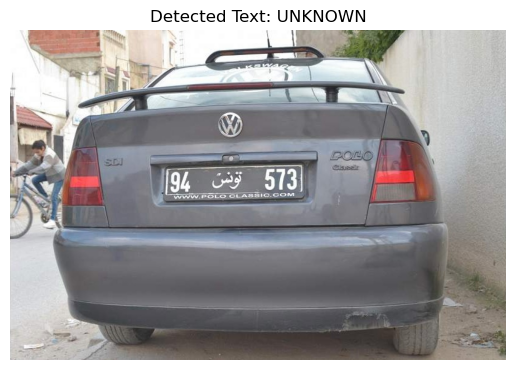

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Bounding box coordinates: x=324, y=145, w=344, h=258
Invalid bounding box coordinates: x=324, y=145, w=344, h=258
Image: 1001.jpg, Detected Text: UNKNOWN


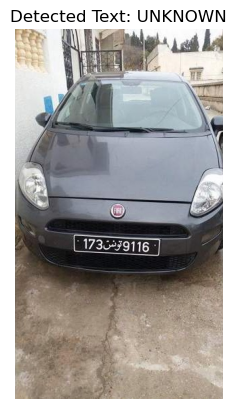

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Bounding box coordinates: x=345, y=198, w=370, h=346
Invalid bounding box coordinates: x=345, y=198, w=370, h=346
Image: 1002.jpg, Detected Text: UNKNOWN


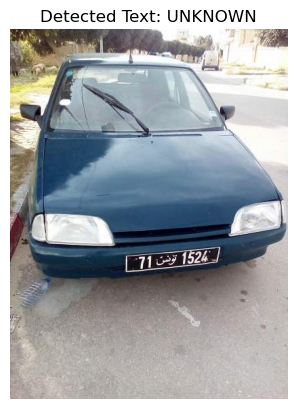

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Bounding box coordinates: x=288, y=358, w=319, h=490
Invalid bounding box coordinates: x=288, y=358, w=319, h=490
Image: 1003.jpg, Detected Text: UNKNOWN


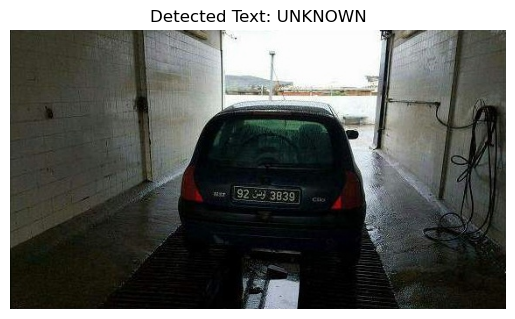

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step
Bounding box coordinates: x=286, y=117, w=317, h=271
Invalid bounding box coordinates: x=286, y=117, w=317, h=271
Image: 1004.jpg, Detected Text: UNKNOWN


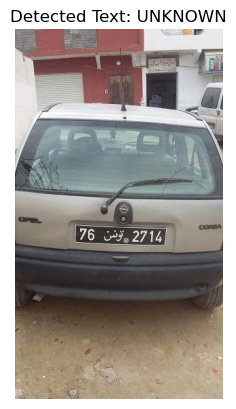

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Bounding box coordinates: x=362, y=156, w=386, h=274
Invalid bounding box coordinates: x=362, y=156, w=386, h=274
Image: 1005.jpg, Detected Text: UNKNOWN


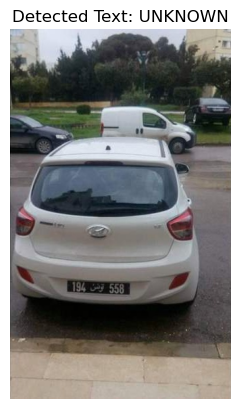

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Bounding box coordinates: x=352, y=172, w=379, h=304
Invalid bounding box coordinates: x=352, y=172, w=379, h=304
Image: 1006.jpg, Detected Text: UNKNOWN


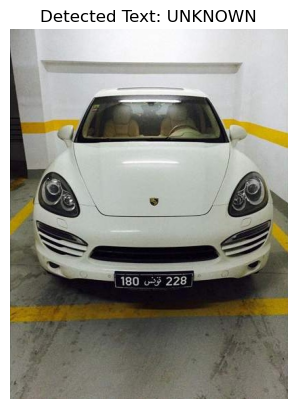

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Bounding box coordinates: x=297, y=126, w=315, h=224
Invalid bounding box coordinates: x=297, y=126, w=315, h=224
Image: 1007.jpg, Detected Text: UNKNOWN


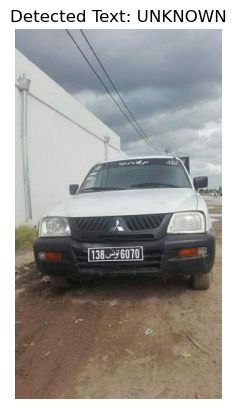

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Bounding box coordinates: x=473, y=341, w=516, h=538
Invalid bounding box coordinates: x=473, y=341, w=516, h=538
Image: 1008.jpg, Detected Text: UNKNOWN


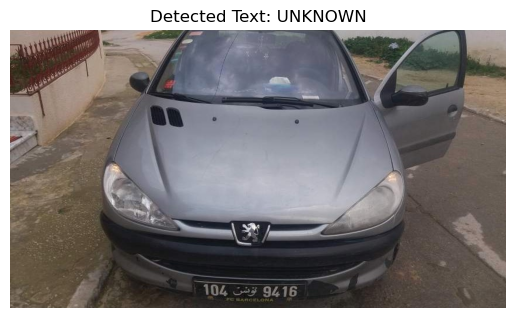

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Bounding box coordinates: x=385, y=335, w=433, h=567
Invalid bounding box coordinates: x=385, y=335, w=433, h=567
Image: 1009.jpg, Detected Text: UNKNOWN


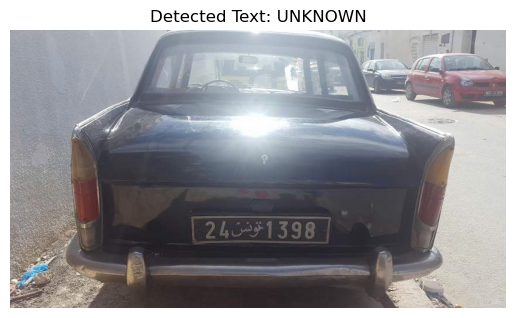

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Bounding box coordinates: x=331, y=229, w=358, h=372
Invalid bounding box coordinates: x=331, y=229, w=358, h=372
Image: 1010.jpg, Detected Text: UNKNOWN


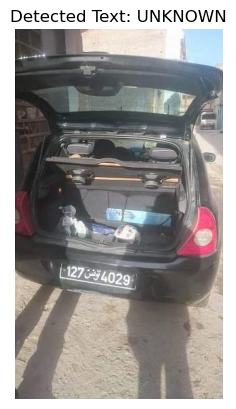

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Bounding box coordinates: x=282, y=153, w=305, h=245
Invalid bounding box coordinates: x=282, y=153, w=305, h=245
Image: 1011.jpg, Detected Text: UNKNOWN


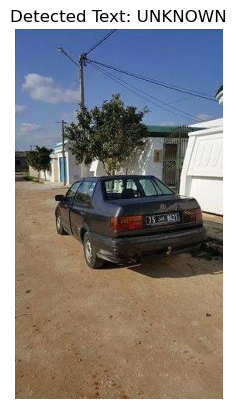

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Bounding box coordinates: x=427, y=367, w=467, h=565
Invalid bounding box coordinates: x=427, y=367, w=467, h=565
Image: 1012.jpg, Detected Text: UNKNOWN


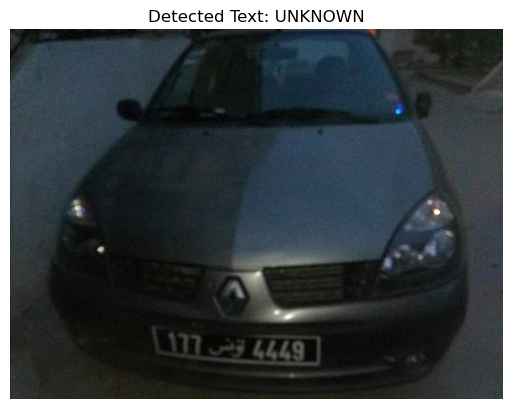

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Bounding box coordinates: x=360, y=186, w=381, h=312
Invalid bounding box coordinates: x=360, y=186, w=381, h=312
Image: 1013.jpg, Detected Text: UNKNOWN


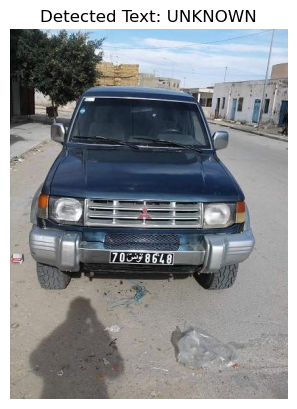

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Bounding box coordinates: x=381, y=316, w=411, h=485
Invalid bounding box coordinates: x=381, y=316, w=411, h=485
Image: 1014.jpg, Detected Text: UNKNOWN


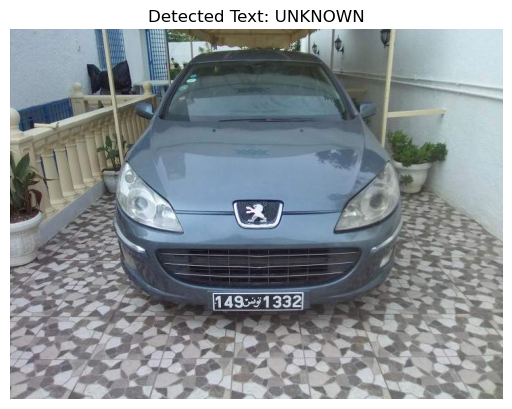

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Bounding box coordinates: x=338, y=311, w=365, h=457
Invalid bounding box coordinates: x=338, y=311, w=365, h=457
Image: 1015.jpg, Detected Text: UNKNOWN


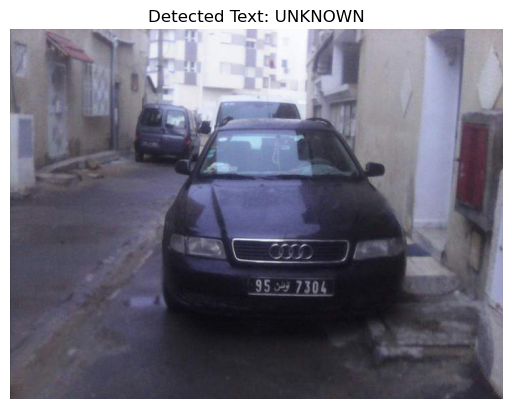

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
Bounding box coordinates: x=424, y=324, w=466, h=541
Invalid bounding box coordinates: x=424, y=324, w=466, h=541
Image: 1016.jpg, Detected Text: UNKNOWN


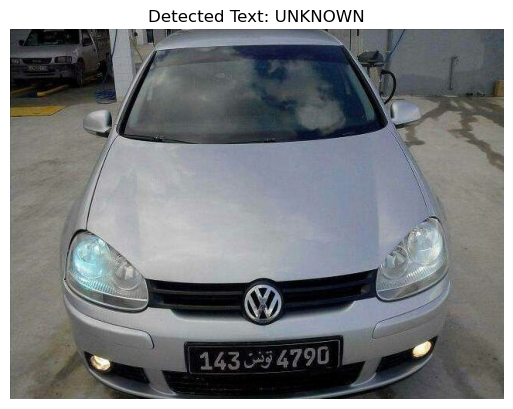

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Bounding box coordinates: x=348, y=285, w=396, h=528
Invalid bounding box coordinates: x=348, y=285, w=396, h=528
Image: 1017.jpg, Detected Text: UNKNOWN


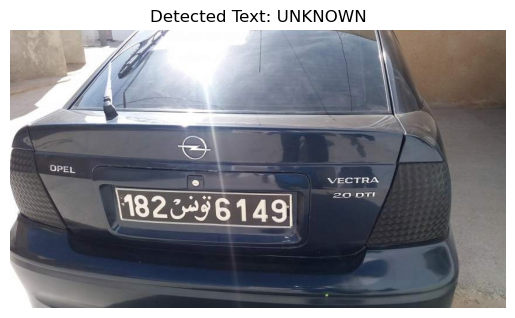

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Bounding box coordinates: x=317, y=329, w=357, h=470
Invalid bounding box coordinates: x=317, y=329, w=357, h=470
Image: 1018.jpg, Detected Text: UNKNOWN


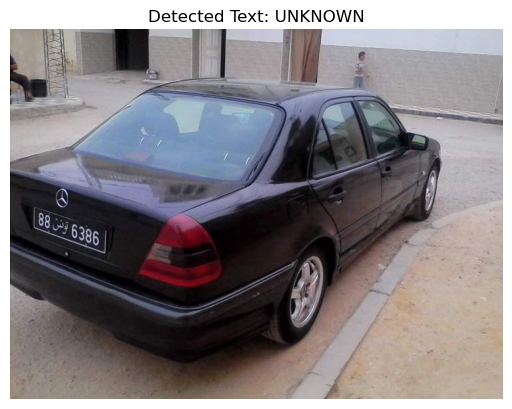

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Bounding box coordinates: x=416, y=494, w=462, h=654
Invalid bounding box coordinates: x=416, y=494, w=462, h=654
Image: 1019.jpg, Detected Text: UNKNOWN


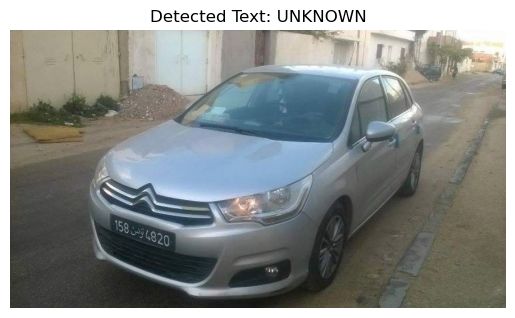

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Bounding box coordinates: x=321, y=154, w=342, h=273
Invalid bounding box coordinates: x=321, y=154, w=342, h=273
Image: 1020.jpg, Detected Text: UNKNOWN


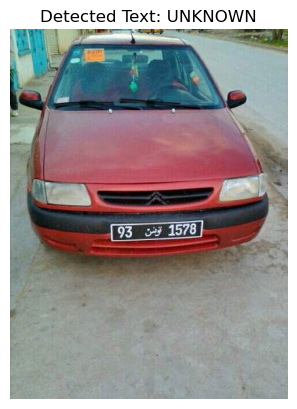

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Bounding box coordinates: x=358, y=149, w=381, h=273
Invalid bounding box coordinates: x=358, y=149, w=381, h=273
Image: 1021.jpg, Detected Text: UNKNOWN


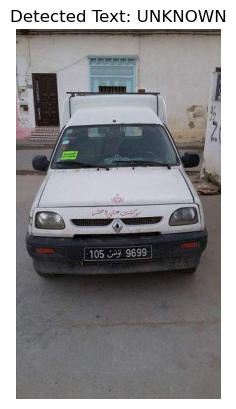

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Bounding box coordinates: x=422, y=367, w=458, h=557
Invalid bounding box coordinates: x=422, y=367, w=458, h=557
Image: 1022.jpg, Detected Text: UNKNOWN


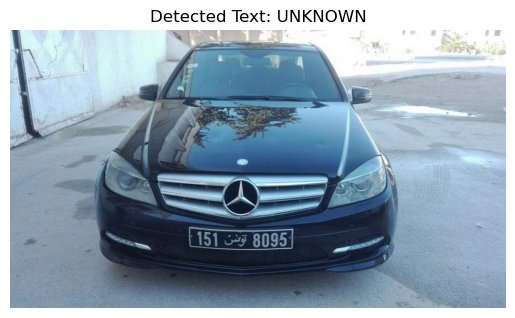

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Bounding box coordinates: x=302, y=333, w=327, h=466
Invalid bounding box coordinates: x=302, y=333, w=327, h=466
Image: 1023.jpg, Detected Text: UNKNOWN


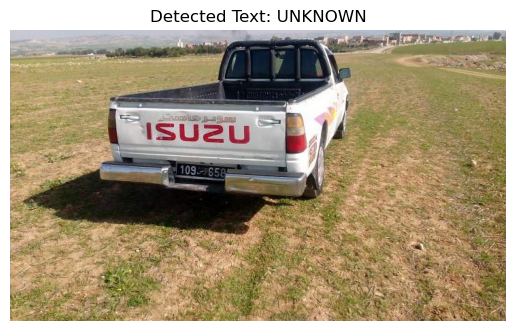

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Bounding box coordinates: x=323, y=238, w=354, h=379
Invalid bounding box coordinates: x=323, y=238, w=354, h=379
Image: 1024.jpg, Detected Text: UNKNOWN


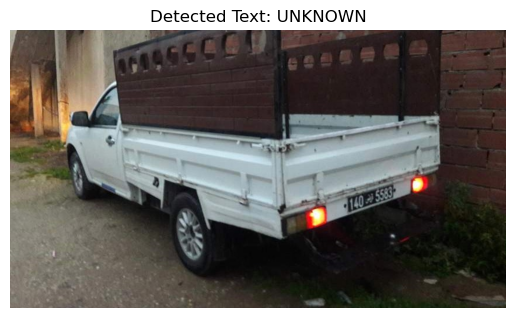

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Bounding box coordinates: x=407, y=188, w=438, h=354
Invalid bounding box coordinates: x=407, y=188, w=438, h=354
Image: 1025.jpg, Detected Text: UNKNOWN


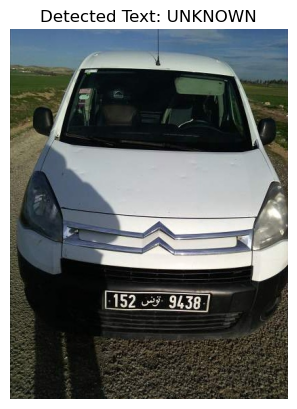

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Bounding box coordinates: x=363, y=190, w=386, h=321
Invalid bounding box coordinates: x=363, y=190, w=386, h=321
Image: 1026.jpg, Detected Text: UNKNOWN


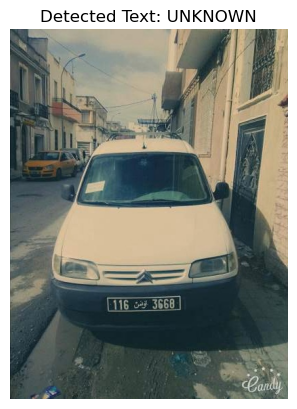

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Bounding box coordinates: x=449, y=338, w=489, h=527
Invalid bounding box coordinates: x=449, y=338, w=489, h=527
Image: 1027.jpg, Detected Text: UNKNOWN


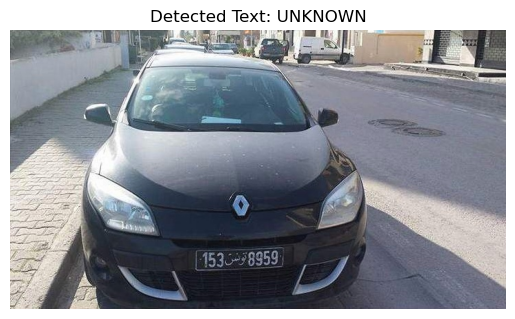

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Bounding box coordinates: x=346, y=162, w=375, h=320
Invalid bounding box coordinates: x=346, y=162, w=375, h=320
Image: 1028.jpg, Detected Text: UNKNOWN


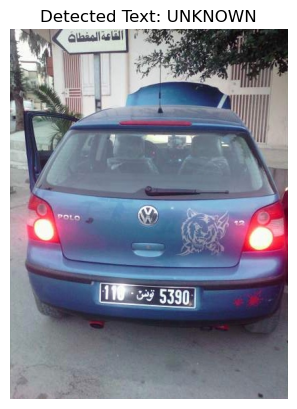

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Bounding box coordinates: x=405, y=288, w=445, h=452
Invalid bounding box coordinates: x=405, y=288, w=445, h=452
Image: 1029.jpg, Detected Text: UNKNOWN


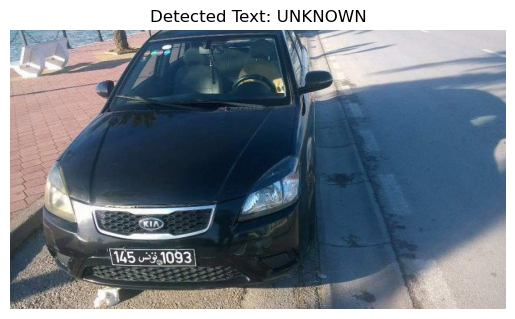

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Bounding box coordinates: x=470, y=327, w=514, h=539
Invalid bounding box coordinates: x=470, y=327, w=514, h=539
Image: 1030.jpg, Detected Text: UNKNOWN


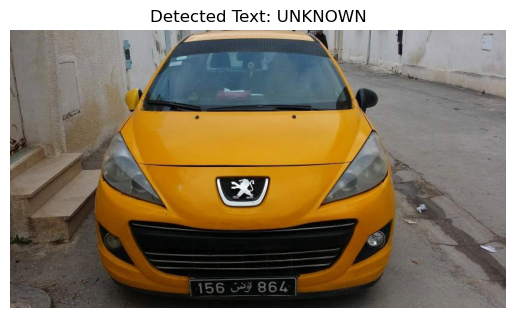

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Bounding box coordinates: x=393, y=245, w=431, h=433
Invalid bounding box coordinates: x=393, y=245, w=431, h=433
Image: 1031.jpg, Detected Text: UNKNOWN


KeyboardInterrupt: 

In [56]:
import matplotlib.pyplot as plt

# Perform detection and recognition, then display the results
for img, filename in zip(test_images, filenames):
    detected_text = detect_and_recognize(img, detection_model, recognition_model)
    print(f'Image: {filename}, Detected Text: {detected_text}')

    # Display the image with the detected text
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Detected Text: {detected_text}')
    plt.axis('off')  # Hide the axes
    plt.show()


In [68]:
def detect_and_recognize(image, detection_model, recognition_model):
    # Step 1: Detect license plate
    img_resized = cv2.resize(image, (224, 224))  # Resize the image for detection model
    img_expanded = np.expand_dims(img_resized, axis=0)  # Expand dimensions for batch processing
    bbox = detection_model.predict(img_expanded)[0]  # Assuming detection_model returns bounding box coordinates

    # Ensure bbox values are integers
    x, y, w, h = map(int, bbox)

    # Extract license plate using bounding box
    detected_plate = image[y:y+h, x:x+w]

    # Step 2: Recognize characters on the license plate
    detected_plate_resized = cv2.resize(detected_plate, (64, 128))  # Resize for recognition model
    detected_plate_resized = detected_plate_resized / 255.0  # Normalize
    detected_text = recognition_model.predict(np.expand_dims(detected_plate_resized, axis=0))[0]  # Assuming recognition_model predicts text

    return detected_text


In [51]:
def detect_and_recognize(image, detection_model, recognition_model):
    # Step 1: Detect license plate
    img_resized = cv2.resize(image, (224, 224))  # Resize the image for detection model
    img_expanded = np.expand_dims(img_resized, axis=0)  # Expand dimensions for batch processing
    bbox = detection_model.predict(img_expanded)[0]  # Assuming detection_model returns bounding box coordinates

    # Ensure bbox values are integers
    x, y, w, h = map(int, bbox)

    # Check if bounding box is within image bounds
    if x < 0 or y < 0 or w <= 0 or h <= 0 or x + w > image.shape[1] or y + h > image.shape[0]:
        print(f"Invalid bounding box coordinates: x={x}, y={y}, w={w}, h={h}")
        return "UNKNOWN"

    # Extract license plate using bounding box
    detected_plate = image[y:y+h, x:x+w]

    # Print some debug information
    print(f"Bounding box coordinates: x={x}, y={y}, w={w}, h={h}")
    print(f"Detected plate shape: {detected_plate.shape}")

    # Step 2: Recognize characters on the license plate
    detected_plate_resized = cv2.resize(detected_plate, (64, 128))  # Resize for recognition model
    detected_plate_resized = detected_plate_resized / 255.0  # Normalize
    detected_text = recognition_model.predict(np.expand_dims(detected_plate_resized, axis=0))[0]  # Assuming recognition_model predicts text

    return detected_text


In [53]:
def detect_and_recognize(image, detection_model, recognition_model):
    # Step 1: Detect license plate
    img_resized = cv2.resize(image, (224, 224))  # Resize the image for detection model
    img_expanded = np.expand_dims(img_resized, axis=0)  # Expand dimensions for batch processing
    bbox = detection_model.predict(img_expanded)[0]  # Assuming detection_model returns bounding box coordinates

    # Ensure bbox values are integers
    x, y, w, h = map(int, bbox)

    # Check if bounding box is within image bounds
    if x < 0 or y < 0 or w <= 0 or h <= 0 or x + w > img_resized.shape[1] or y + h > img_resized.shape[0]:
        print(f"Invalid bounding box coordinates: x={x}, y={y}, w={w}, h={h}")
        return "UNKNOWN"

    # Extract license plate using bounding box
    detected_plate = image[y:y+h, x:x+w]

    # Print some debug information
    print(f"Bounding box coordinates: x={x}, y={y}, w={w}, h={h}")
    print(f"Detected plate shape: {detected_plate.shape}")

    # Step 2: Recognize characters on the license plate
    detected_plate_resized = cv2.resize(detected_plate, (64, 128))  # Resize for recognition model
    detected_plate_resized = detected_plate_resized / 255.0  # Normalize
    detected_text = recognition_model.predict(np.expand_dims(detected_plate_resized, axis=0))[0]  # Assuming recognition_model predicts text

    return detected_text


In [55]:
def detect_and_recognize(image, detection_model1, recognition_model):
    # Step 1: Detect license plate
    img_resized = cv2.resize(image, (224, 224))  # Resize the image for detection model
    img_expanded = np.expand_dims(img_resized, axis=0)  # Expand dimensions for batch processing
    bbox = detection_model1.predict(img_expanded)[0]  # Assuming detection_model returns bounding box coordinates

    # Ensure bbox values are integers
    x, y, w, h = map(int, bbox)

    # Print bounding box coordinates for debugging
    print(f"Bounding box coordinates: x={x}, y={y}, w={w}, h={h}")

    # Check if bounding box is within image bounds
    if x < 0 or y < 0 or w <= 0 or h <= 0 or x + w > img_resized.shape[1] or y + h > img_resized.shape[0]:
        print(f"Invalid bounding box coordinates: x={x}, y={y}, w={w}, h={h}")
        return "UNKNOWN"

    # Extract license plate using bounding box
    detected_plate = image[y:y+h, x:x+w]

    # Step 2: Recognize characters on the license plate
    detected_plate_resized = cv2.resize(detected_plate, (64, 128))  # Resize for recognition model
    detected_plate_resized = detected_plate_resized / 255.0  # Normalize
    detected_text = recognition_model.predict(np.expand_dims(detected_plate_resized, axis=0))[0]  # Assuming recognition_model predicts text

    return detected_text


In [105]:
test_images = load_images(r'C:\Users\hp\Documents\Assigments\test')
sample_submission = pd.read_csv(r'C:\Users\hp\Documents\Assigments\SampleSubmission.csv')

In [71]:
test_images[0]

[array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [203, 205, 205],
         [199, 201, 201],
         [191, 191, 191]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [198, 200, 200],
         [195, 197, 197],
         [193, 193, 193]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [194, 196, 196],
         [192, 194, 194],
         [196, 196, 196]],
 
        ...,
 
        [[169, 168, 170],
         [182, 181, 183],
         [184, 183, 187],
         ...,
         [131, 147, 154],
         [139, 155, 162],
         [137, 153, 160]],
 
        [[187, 186, 188],
         [193, 192, 194],
         [188, 187, 191],
         ...,
         [131, 146, 155],
         [139, 154, 163],
         [138, 153, 162]],
 
        [[187, 186, 188],
         [190, 189, 191],
         [177, 176, 180],
         ...,
         [131, 146, 155],
  

In [97]:
predictions = []

for i, filename in enumerate(sample_submission['id']):
    image_path = f'/path/to/test/{filename}.jpg'
    image = cv2.imread(image_path)
    if image is not None:
        detected_text = detect_and_recognize(image, detection_model, recognition_model)
        row = [0] * 10
        for char in detected_text:
            if char.isdigit():
                row[int(char)] = 1
        predictions.append(row)
    else:
        predictions.append([0] * 10)

submission_df = pd.DataFrame(predictions, columns=sample_submission.columns[1:])
submission_df.insert(0, 'id', sample_submission['id'])
#submission_df.to_csv('submission.csv', index=False)


In [98]:
submission_df

,id,0,1,2,3,4,5,6,7,8,9
0,img_901_1,0,0,0,0,0,0,0,0,0,0
1,img_901_2,0,0,0,0,0,0,0,0,0,0
2,img_901_3,0,0,0,0,0,0,0,0,0,0
3,img_901_4,0,0,0,0,0,0,0,0,0,0
4,img_901_5,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1465,img_1113_3,0,0,0,0,0,0,0,0,0,0
1466,img_1113_4,0,0,0,0,0,0,0,0,0,0
1467,img_1113_5,0,0,0,0,0,0,0,0,0,0
1468,img_1113_6,0,0,0,0,0,0,0,0,0,0


In [74]:
# Save the detection model
detection_model.save('detection_model.h5')

# Save the recognition model
recognition_model.save('recognition_model.h5')


In [91]:
# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image at path {image_path} could not be loaded.")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    return image

# Function to detect and recognize license plate text
def detect_and_recognize(image, detection_model, recognition_model):
    try:
        # Step 1: Detect license plate
        img_resized = cv2.resize(image, (224, 224))  # Resize for detection model input size if necessary
        img_expanded = np.expand_dims(img_resized, axis=0)
        bbox = detection_model.predict(img_expanded)[0]
        
        ymin, xmin, ymax, xmax = bbox
        ymin, xmin, ymax, xmax = int(ymin * image.shape[0]), int(xmin * image.shape[1]), int(ymax * image.shape[0]), int(xmax * image.shape[1])
        
        # Check if bounding box coordinates are valid
        if ymin >= ymax or xmin >= xmax or ymin < 0 or xmin < 0 or ymax > image.shape[0] or xmax > image.shape[1]:
            raise ValueError("Invalid bounding box coordinates.")
        
        # Step 2: Crop the license plate
        cropped_img = image[ymin:ymax, xmin:xmax]
        
        # Check if cropped image is empty
        if cropped_img.size == 0:
            raise ValueError("Cropped image is empty.")
        
        cropped_resized = cv2.resize(cropped_img, (128, 64))
        cropped_expanded = np.expand_dims(cropped_resized, axis=0)
        
        # Step 3: Recognize characters
        char_probs = recognition_model.predict(cropped_expanded)
        char_indices = np.argmax(char_probs, axis=2)[0]
        
        char_set = "ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"
        detected_text = ''.join([char_set[idx] for idx in char_indices])
        
        return detected_text
    
    except Exception as e:
        print(f"Error in detect_and_recognize: {e}")
        return None

In [94]:

# Path to the image you want to make a prediction on
image_path = r'C:\Users\hp\Documents\Assigments\test\1001.jpg'

# Load and preprocess the image
image = load_and_preprocess_image(image_path)

# Make prediction
detected_text = detect_and_recognize(image, detection_model, recognition_model)

print(f'Detected text: {detected_text}')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
Detected text: 161T795AAA


In [96]:
image_path = r'C:\Users\hp\Documents\Assigments\test\956.jpg'

image = load_and_preprocess_image(image_path)

detected_text = detect_and_recognize(image, detection_model, recognition_model)

print(f'Detected text: {detected_text}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
Detected text: 134T8089AA


In [110]:
predictions = []

for i, filename in enumerate(sample_submission['id']):
    image_path = f'/path/to/test/{filename}.jpg'
    image = cv2.imread(image_path)
    if image is not None:
        detected_text = detect_and_recognize(image, detection_model, recognition_model)
        row = [0] * 10
        for char in detected_text:
            if char.isdigit():
                digit_index = int(char)
                if digit_index >= 0 and digit_index < 10:  # Ensure index is within bounds
                    row[digit_index] = 1
        predictions.append(row)
    else:
        predictions.append([0] * 10)



In [111]:
predictions = []

for i, filename in enumerate(sample_submission['id']):
    image_path = f'/path/to/test/{filename}.jpg'
    image = cv2.imread(image_path)
    if image is not None:
        detected_text = detect_and_recognize(image, detection_model, recognition_model)
        row = [0] * 10
        for char in detected_text:
            if char.isdigit():
                digit_index = int(char)
                if digit_index >= 0 and digit_index < 10:  # Ensure index is within bounds
                    row[digit_index] = 1
        predictions.append(row)
    else:
        predictions.append([0] * 10)


In [112]:
predictions

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0,

In [ ]:
# Create submission DataFrame
submission_df = pd.DataFrame(predictions, columns=[str(i) for i in range(10)])  # Assuming columns '0' to '9'
submission_df.insert(0, 'id', sample_submission['id'])  # Insert 'id' column from sample_submission

# Uncomment the line below to save the submission
# submission_df.to_csv('submission.csv', index=False)

In [107]:
submission_df

,id,0,1,2,3,4,5,6,7,8,9
0,img_901_1,0,0,0,0,0,0,0,0,0,0
1,img_901_2,0,0,0,0,0,0,0,0,0,0
2,img_901_3,0,0,0,0,0,0,0,0,0,0
3,img_901_4,0,0,0,0,0,0,0,0,0,0
4,img_901_5,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1465,img_1113_3,0,0,0,0,0,0,0,0,0,0
1466,img_1113_4,0,0,0,0,0,0,0,0,0,0
1467,img_1113_5,0,0,0,0,0,0,0,0,0,0
1468,img_1113_6,0,0,0,0,0,0,0,0,0,0


In [108]:
predictions = []

for i, filename in enumerate(sample_submission['id']):
    # Assuming the path to the image
    image_path = f'/path/to/test/{filename}.jpg'
    image = cv2.imread(image_path)
    
    if image is not None:
        detected_text = detect_and_recognize(image)
        row = {'id': filename}
        
        # Initialize columns for digits 0-9
        for digit in range(10):
            row[str(digit)] = 0
        
        # Mark columns based on detected digits
        for char in detected_text:
            if char.isdigit():
                row[char] = 1
        
        predictions.append(row)
    else:
        # Handle case where image cannot be read
        print(f"Image {filename} not found or could not be read.")
        row = {'id': filename}
        for digit in range(10):
            row[str(digit)] = 0
        predictions.append(row)

# Create submission DataFrame
submission_df = pd.DataFrame(predictions)

# Ensure 'id' column is first
submission_df = submission_df[['id'] + [str(i) for i in range(10)]]

# Print or save submission DataFrame
print(submission_df)

Image img_901_1 not found or could not be read.
Image img_901_2 not found or could not be read.
Image img_901_3 not found or could not be read.
Image img_901_4 not found or could not be read.
Image img_901_5 not found or could not be read.
Image img_901_6 not found or could not be read.
Image img_901_7 not found or could not be read.
Image img_902_1 not found or could not be read.
Image img_902_2 not found or could not be read.
Image img_902_3 not found or could not be read.
Image img_902_4 not found or could not be read.
Image img_902_5 not found or could not be read.
Image img_902_6 not found or could not be read.
Image img_902_7 not found or could not be read.
Image img_903_1 not found or could not be read.
Image img_903_2 not found or could not be read.
Image img_903_3 not found or could not be read.
Image img_903_4 not found or could not be read.
Image img_903_5 not found or could not be read.
Image img_903_6 not found or could not be read.
Image img_903_7 not found or could not b

Image img_928_5 not found or could not be read.
Image img_928_6 not found or could not be read.
Image img_928_7 not found or could not be read.
Image img_929_1 not found or could not be read.
Image img_929_2 not found or could not be read.
Image img_929_3 not found or could not be read.
Image img_929_4 not found or could not be read.
Image img_929_5 not found or could not be read.
Image img_929_6 not found or could not be read.
Image img_929_7 not found or could not be read.
Image img_930_1 not found or could not be read.
Image img_930_2 not found or could not be read.
Image img_930_3 not found or could not be read.
Image img_930_4 not found or could not be read.
Image img_930_5 not found or could not be read.
Image img_930_6 not found or could not be read.
Image img_930_7 not found or could not be read.
Image img_931_1 not found or could not be read.
Image img_931_2 not found or could not be read.
Image img_931_3 not found or could not be read.
Image img_931_4 not found or could not b

Image img_954_2 not found or could not be read.
Image img_954_3 not found or could not be read.
Image img_954_4 not found or could not be read.
Image img_954_5 not found or could not be read.
Image img_954_6 not found or could not be read.
Image img_954_7 not found or could not be read.
Image img_955_1 not found or could not be read.
Image img_955_2 not found or could not be read.
Image img_955_3 not found or could not be read.
Image img_955_4 not found or could not be read.
Image img_955_5 not found or could not be read.
Image img_955_6 not found or could not be read.
Image img_955_7 not found or could not be read.
Image img_956_1 not found or could not be read.
Image img_956_2 not found or could not be read.
Image img_956_3 not found or could not be read.
Image img_956_4 not found or could not be read.
Image img_956_5 not found or could not be read.
Image img_956_6 not found or could not be read.
Image img_956_7 not found or could not be read.
Image img_957_1 not found or could not b

Image img_981_1 not found or could not be read.
Image img_981_2 not found or could not be read.
Image img_981_3 not found or could not be read.
Image img_981_4 not found or could not be read.
Image img_981_5 not found or could not be read.
Image img_981_6 not found or could not be read.
Image img_981_7 not found or could not be read.
Image img_982_1 not found or could not be read.
Image img_982_2 not found or could not be read.
Image img_982_3 not found or could not be read.
Image img_982_4 not found or could not be read.
Image img_982_5 not found or could not be read.
Image img_982_6 not found or could not be read.
Image img_982_7 not found or could not be read.
Image img_983_1 not found or could not be read.
Image img_983_2 not found or could not be read.
Image img_983_3 not found or could not be read.
Image img_983_4 not found or could not be read.
Image img_983_5 not found or could not be read.
Image img_983_6 not found or could not be read.
Image img_983_7 not found or could not b

Image img_1006_1 not found or could not be read.
Image img_1006_2 not found or could not be read.
Image img_1006_3 not found or could not be read.
Image img_1006_4 not found or could not be read.
Image img_1006_5 not found or could not be read.
Image img_1006_6 not found or could not be read.
Image img_1006_7 not found or could not be read.
Image img_1007_1 not found or could not be read.
Image img_1007_2 not found or could not be read.
Image img_1007_3 not found or could not be read.
Image img_1007_4 not found or could not be read.
Image img_1007_5 not found or could not be read.
Image img_1007_6 not found or could not be read.
Image img_1007_7 not found or could not be read.
Image img_1008_1 not found or could not be read.
Image img_1008_2 not found or could not be read.
Image img_1008_3 not found or could not be read.
Image img_1008_4 not found or could not be read.
Image img_1008_5 not found or could not be read.
Image img_1008_6 not found or could not be read.
Image img_1008_7 not

Image img_1030_7 not found or could not be read.
Image img_1031_1 not found or could not be read.
Image img_1031_2 not found or could not be read.
Image img_1031_3 not found or could not be read.
Image img_1031_4 not found or could not be read.
Image img_1031_5 not found or could not be read.
Image img_1031_6 not found or could not be read.
Image img_1031_7 not found or could not be read.
Image img_1032_1 not found or could not be read.
Image img_1032_2 not found or could not be read.
Image img_1032_3 not found or could not be read.
Image img_1032_4 not found or could not be read.
Image img_1032_5 not found or could not be read.
Image img_1032_6 not found or could not be read.
Image img_1032_7 not found or could not be read.
Image img_1033_1 not found or could not be read.
Image img_1033_2 not found or could not be read.
Image img_1033_3 not found or could not be read.
Image img_1033_4 not found or could not be read.
Image img_1033_5 not found or could not be read.
Image img_1033_6 not

Image img_1056_4 not found or could not be read.
Image img_1056_5 not found or could not be read.
Image img_1056_6 not found or could not be read.
Image img_1056_7 not found or could not be read.
Image img_1057_1 not found or could not be read.
Image img_1057_2 not found or could not be read.
Image img_1057_3 not found or could not be read.
Image img_1057_4 not found or could not be read.
Image img_1057_5 not found or could not be read.
Image img_1057_6 not found or could not be read.
Image img_1057_7 not found or could not be read.
Image img_1058_1 not found or could not be read.
Image img_1058_2 not found or could not be read.
Image img_1058_3 not found or could not be read.
Image img_1058_4 not found or could not be read.
Image img_1058_5 not found or could not be read.
Image img_1058_6 not found or could not be read.
Image img_1058_7 not found or could not be read.
Image img_1059_1 not found or could not be read.
Image img_1059_2 not found or could not be read.
Image img_1059_3 not

Image img_1082_4 not found or could not be read.
Image img_1082_5 not found or could not be read.
Image img_1082_6 not found or could not be read.
Image img_1082_7 not found or could not be read.
Image img_1083_1 not found or could not be read.
Image img_1083_2 not found or could not be read.
Image img_1083_3 not found or could not be read.
Image img_1083_4 not found or could not be read.
Image img_1083_5 not found or could not be read.
Image img_1083_6 not found or could not be read.
Image img_1083_7 not found or could not be read.
Image img_1084_1 not found or could not be read.
Image img_1084_2 not found or could not be read.
Image img_1084_3 not found or could not be read.
Image img_1084_4 not found or could not be read.
Image img_1084_5 not found or could not be read.
Image img_1084_6 not found or could not be read.
Image img_1084_7 not found or could not be read.
Image img_1085_1 not found or could not be read.
Image img_1085_2 not found or could not be read.
Image img_1085_3 not

Image img_1109_4 not found or could not be read.
Image img_1109_5 not found or could not be read.
Image img_1109_6 not found or could not be read.
Image img_1109_7 not found or could not be read.
Image img_1110_1 not found or could not be read.
Image img_1110_2 not found or could not be read.
Image img_1110_3 not found or could not be read.
Image img_1110_4 not found or could not be read.
Image img_1110_5 not found or could not be read.
Image img_1110_6 not found or could not be read.
Image img_1110_7 not found or could not be read.
Image img_1111_1 not found or could not be read.
Image img_1111_2 not found or could not be read.
Image img_1111_3 not found or could not be read.
Image img_1111_4 not found or could not be read.
Image img_1111_5 not found or could not be read.
Image img_1111_6 not found or could not be read.
Image img_1111_7 not found or could not be read.
Image img_1112_1 not found or could not be read.
Image img_1112_2 not found or could not be read.
Image img_1112_3 not

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━

In [114]:
df

,filename,detected_text
0,1000.jpg,110T4007AA
1,1001.jpg,161T795AAA
2,1002.jpg,16TT951AAA
3,1003.jpg,105T2151AA
4,1004.jpg,135T4447AA
...,...,...
205,995.jpg,140T7447AA
206,996.jpg,10TT299AAA
207,997.jpg,141T7052AA
208,998.jpg,100T2514AA


In [134]:
# Folder containing the images
folder_path = r'C:\Users\hp\Documents\Assigments\test'

# Initialize an empty list to store results
results = []

# Iterate through each file in the folder
for filename in os.listdir(folder_path):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Adjust based on your image formats
        # Construct the full path to the image
        image_path = os.path.join(folder_path, filename)

        # Load and preprocess the image
        image = load_and_preprocess_image(image_path)

        # Assuming you have loaded your detection_model and recognition_model beforehand
        # Detect and recognize text in the image
        detected_text = detect_and_recognize(image, detection_model, recognition_model)

        # Append the result to the list
        results.append({
            'id': filename,
            'detected_text': detected_text
        })

# Create a DataFrame from the results list
df = pd.DataFrame(results)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━

In [146]:
df

,filename,detected_text
0,1000.jpg,110T4007AA
1,1001.jpg,161T795AAA
2,1002.jpg,16TT951AAA
3,1003.jpg,105T2151AA
4,1004.jpg,135T4447AA
...,...,...
205,995.jpg,140T7447AA
206,996.jpg,10TT299AAA
207,997.jpg,141T7052AA
208,998.jpg,100T2514AA


In [144]:
new_rows = []

# Process each row in the original DataFrame
for index, row in df.iterrows():
    filename = row['filename'].split('.')[0]  # Extract the base filename without extension
    detected_text = row['detected_text']
    
    # Create a new row for each character in detected_text
    for i, char in enumerate(detected_text, start=1):
        new_row = {'id': f'img_{filename}_{i}'}
        for digit in range(10):
            new_row[str(digit)] = 1 if char == str(digit) else 0
        new_rows.append(new_row)

# Convert the list of new rows into a DataFrame
new_data = pd.DataFrame(new_rows)

# Display the modified DataFrame
print(new_data)

              id  0  1  2  3  4  5  6  7  8  9
0     img_1000_1  0  1  0  0  0  0  0  0  0  0
1     img_1000_2  0  1  0  0  0  0  0  0  0  0
2     img_1000_3  1  0  0  0  0  0  0  0  0  0
3     img_1000_4  0  0  0  0  0  0  0  0  0  0
4     img_1000_5  0  0  0  0  1  0  0  0  0  0
...          ... .. .. .. .. .. .. .. .. .. ..
2095   img_999_6  0  0  0  0  0  0  0  0  0  1
2096   img_999_7  0  0  0  0  1  0  0  0  0  0
2097   img_999_8  0  0  0  0  0  0  0  0  0  0
2098   img_999_9  0  0  0  0  0  0  0  0  0  0
2099  img_999_10  0  0  0  0  0  0  0  0  0  0

[2100 rows x 11 columns]


In [ ]:
output_file_path = '/mnt/data/transformed_data.csv'
new_data.to_csv(output_file_path, index=False)